# Multi-Microphone Speech Enhancement
***ET4386 Estimation and Detection Project***

*Author: Yanqi Hong | Kaishen Lin*

In [33]:
#import library
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
from scipy.signal import hamming
from scipy.signal import welch
from scipy.fft import fft
from scipy.fftpack import fft
import librosa
import scipy.special as sp
import soundfile as sf
import statistics

plt.figure(dpi=200)
plt.rcParams['font.family'] = 'Times New Roman'

<Figure size 1280x960 with 0 Axes>

## 1. Data analysis

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,-0.601877,0.418057,0.899642,0.552187,1.960172,0.394602,-1.206954,0.620165,-0.615556,-1.513973,-1.196425,-2.762326,0.858804,-0.922880,-0.498346,-0.359855
1,-0.558698,0.627691,0.432097,0.870507,0.135786,-0.971545,0.742805,0.578576,0.606748,0.657687,0.113250,0.285789,1.360146,-1.687033,-1.384013,-0.815680
2,-0.435740,1.301171,-0.862298,-0.440308,-0.641643,-0.772130,-1.678118,-0.238106,-0.814690,-0.013559,-0.905486,-2.597069,0.490782,-0.500612,-1.232149,0.453484
3,-0.129385,2.303550,0.979460,0.616951,-2.483462,1.348567,-0.810131,0.511974,-1.459831,-0.524404,-0.148524,1.268189,-0.196312,-0.993267,-1.196254,-0.811045
4,1.782667,-0.096093,1.173050,-0.222790,1.132406,1.069529,0.740440,-1.436010,0.359953,0.602519,-0.711907,-1.281912,0.628311,-2.146215,-0.732741,0.710138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601650,0.793297,-0.171666,-1.980768,1.607562,0.240541,-0.008083,-1.087945,-1.092404,-0.417306,-0.671495,-0.145864,0.031540,-0.424179,-2.242013,-0.429119,-0.124813
601651,0.138812,-0.497630,0.423866,0.742603,-1.503920,-0.081858,-0.382618,0.073148,-0.048296,1.135022,-1.212049,0.521332,1.110218,0.346153,-0.688969,0.751895
601652,0.375652,-0.188399,-1.271159,0.473971,1.237980,-0.648695,-1.107027,1.136700,-0.289826,0.254941,1.156137,2.829853,-0.687875,1.606636,0.069226,-0.110797
601653,-0.618543,-1.556029,1.121419,0.700457,-0.359811,-0.306683,1.827398,-0.614968,0.782817,-0.050487,-0.318127,-1.678344,0.532922,0.833319,-1.131452,-1.141156


,0
0,0.000000
1,0.000000
2,0.000000
3,0.000000
4,0.000000
...,...
601650,0.015906
601651,0.015906
601652,0.000000
601653,0.015906


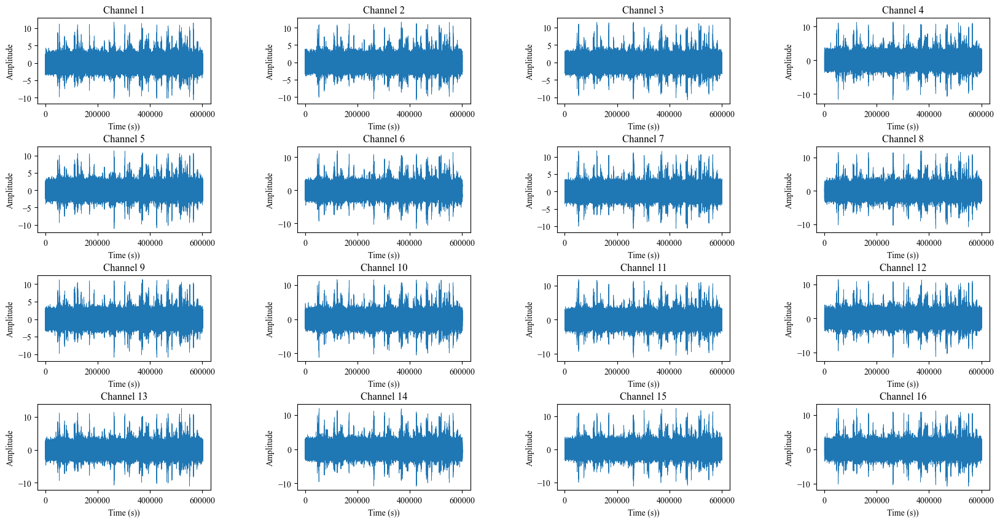

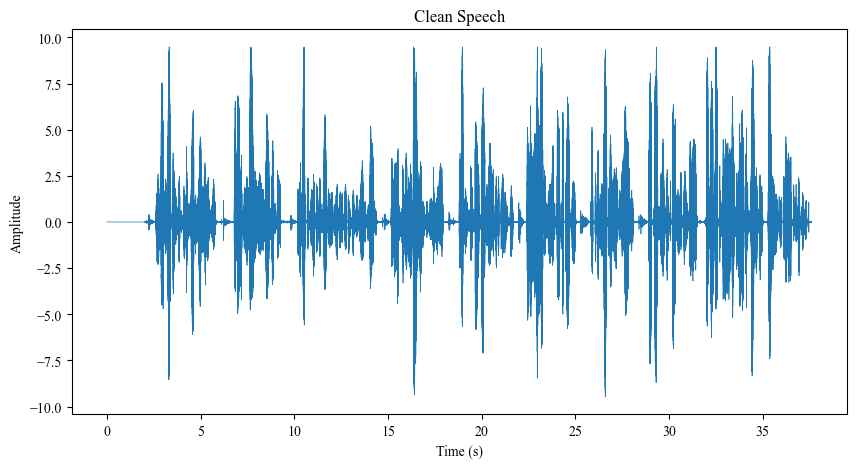

In [34]:
#import csv file 
Data = pd.read_csv('Data.csv', header=None)      #noisy speech with 16 channels
Clean=pd.read_csv('Clean.csv', header=None)      #clean speech
clean_wav_file = "E:\DATA\TUD\Master\TUD_Master_Y1\Q2\ET4386 Estimation and Detection\Project_estimation\clean_wave.wav"
clean_test,fs = librosa.load(clean_wav_file,sr=None) 
display(Data)
display(Clean)
# plot all 16 channels in 16 subplots
plt.figure(figsize=(20,10))
for i in range(1,17):
    t=np.linspace(0, len(Data[i-1])/fs, len(Data[i-1]))
    plt.subplot(4,4,i)
    plt.plot(Data[i-1], linewidth=0.5)  # Set the linewidth to 0.5
    plt.title('Channel '+str(i))
    plt.xlabel('Time (s))')
    plt.ylabel('Amplitude')

plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

# plot clean speech
t=np.linspace(0, len(Clean)/fs, len(Clean))
plt.figure(figsize=(10,5))
plt.plot(t,Clean, linewidth=0.5)  # Set the linewidth to 0.5
plt.title('Clean Speech')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

Clean = np.transpose(Clean.to_numpy())[0]
Data = Data.to_numpy()


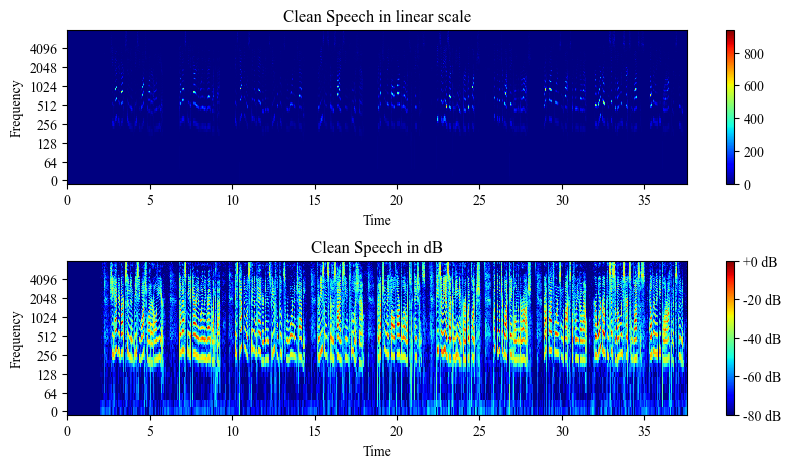

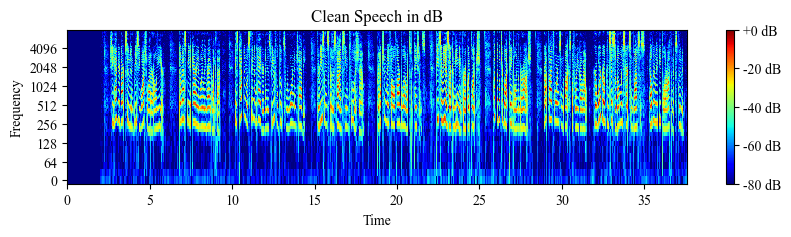

In [53]:
#specrum in clean speech
Fs = 16000
# speech_noisy_freq = np.zeros((320, 3760, 1))

# 采样率
sample_rate = 16000
# 帧大小（20ms）
frame_size = 2*int(sample_rate * 0.02)
# frame_size = 640
# Hop大小（50%重叠）
hop_size = frame_size // 4

# Clean = Clean.to_numpy()
clean_freq = librosa.stft(Clean, n_fft=frame_size, hop_length=hop_size, window='hann')

# subplots
plt.figure(figsize=(10,5))


plt.subplot(2,1,1)
librosa.display.specshow(abs(clean_freq), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Clean Speech in linear scale')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar()
plt.subplots_adjust(hspace=0.5, wspace=0.5) 


plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(clean_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Clean Speech in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.show()

figure = plt.figure(figsize=(10,2))
librosa.display.specshow(librosa.amplitude_to_db(abs(clean_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Clean Speech in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.show()

In [36]:
# Evaluation by SNR
def SNR(NoisyData):
    """
    Calculate the Signal-to-Noise Ratio (SNR) of the given noisy data.

    Parameters:
    NoisyData (array-like): The input noisy data.

    Returns:
    float: The calculated SNR value.
    """
    noise_segment = NoisyData[:15000]
    snr = 10*np.log10(np.var(NoisyData)/np.var((noise_segment)))
    return snr




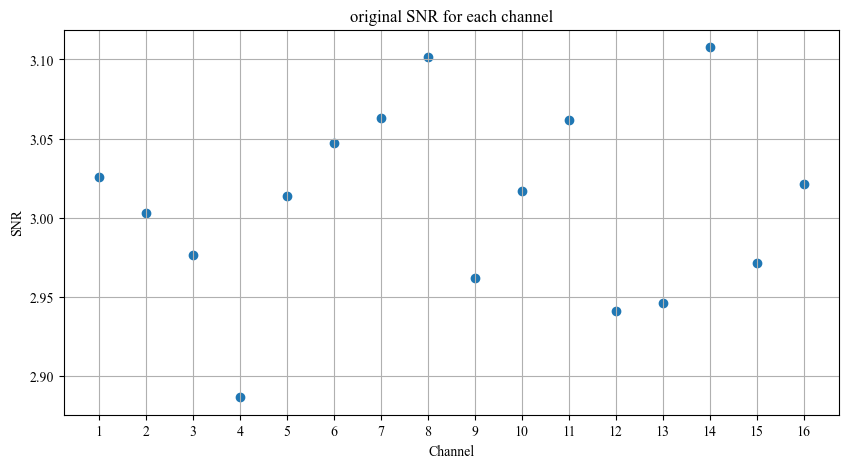

average SNR :  3.0090437071276974


In [37]:
# Calculate SNR for each channel
SNR_each_channel = np.zeros(16)
for i in range(16):
    SNR_each_channel[i] = SNR(Data[:,i])

# Plot SNR for each channel as points
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), SNR_each_channel)
plt.title('original SNR for each channel')
plt.xticks(range(1, 17))
plt.xlabel('Channel')
plt.ylabel('SNR')
plt.grid()
plt.show()

print('average SNR : ', statistics.mean(SNR_each_channel))


C:\Users\skyho\AppData\Local\Temp\ipykernel_45912\3442902621.py:15: ComplexWarning: Casting complex values to real discards the imaginary part
  speech_noisy_freq[:,:,i] = librosa.stft(Data[:,i], n_fft=frame_size, hop_length=hop_size, window='hann')


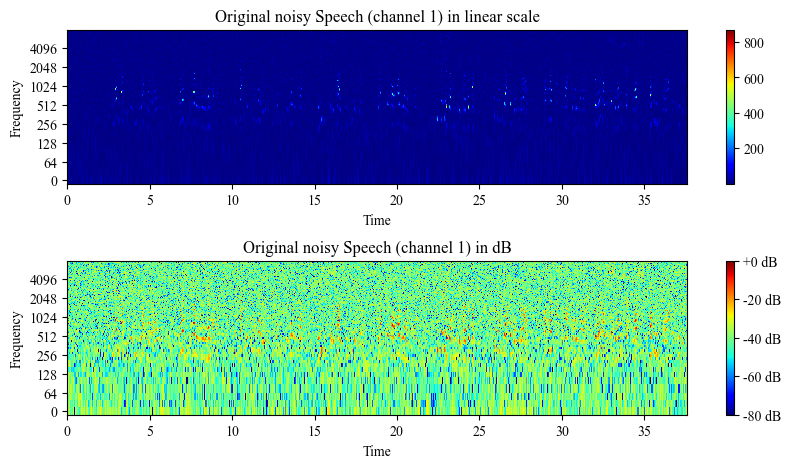

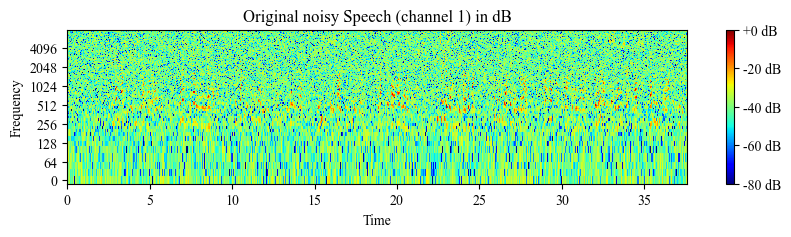

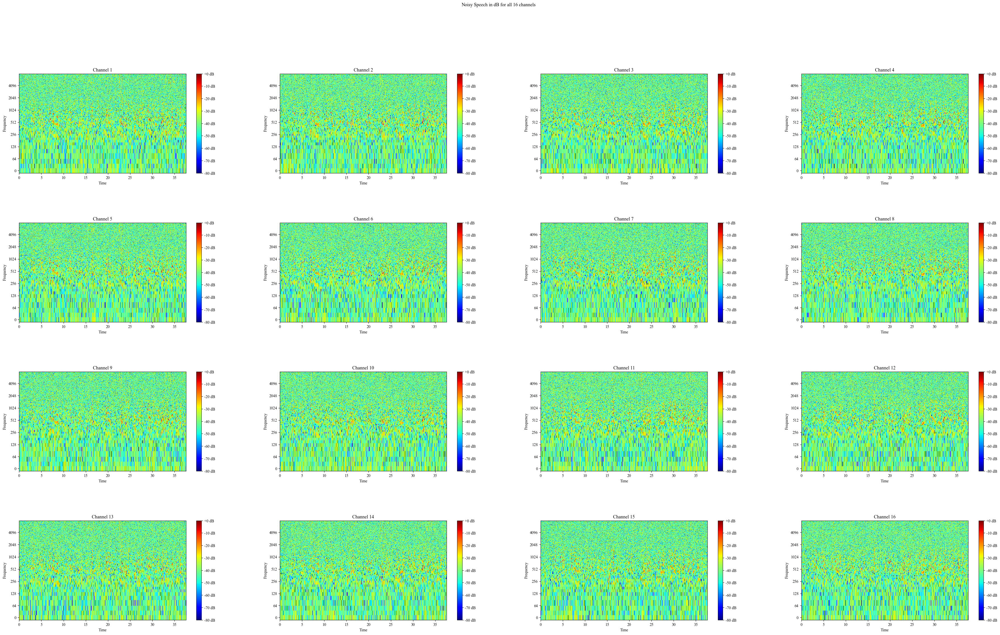

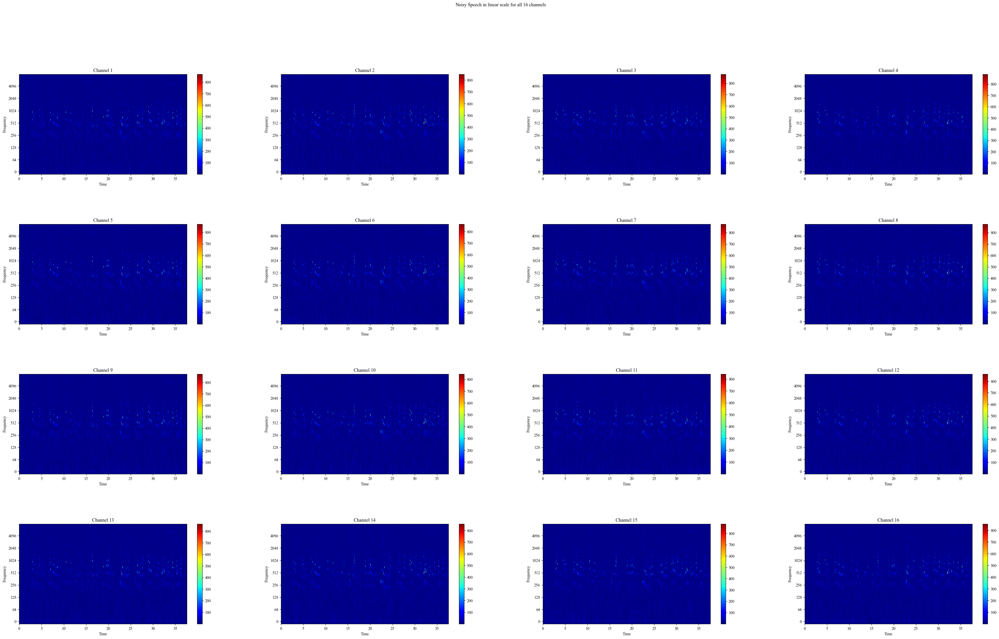

In [54]:
#specrum in noisy speech
Fs = 16000
speech_noisy_freq = np.zeros((321, 3761, 16))

# 采样率
sample_rate = 16000
# 帧大小（20ms）
frame_size = 2*int(sample_rate * 0.02)
# frame_size = 640
# Hop大小（50%重叠）
hop_size = frame_size // 4

#calcuate the fft for each channel
for i in range(16):
    speech_noisy_freq[:,:,i] = librosa.stft(Data[:,i], n_fft=frame_size, hop_length=hop_size, window='hann')


# plot the first channel

plt.figure(figsize=(10,5))
plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,0]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech (channel 1) in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')

plt.subplot(2,1,1)
librosa.display.specshow(abs(speech_noisy_freq[:,:,0]), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech (channel 1) in linear scale')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar()
plt.subplots_adjust(hspace=0.5, wspace=0.5) 
plt.show()


plt.figure(figsize=(10,2))
# plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,0]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech (channel 1) in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.show

# subplots for all 16 channels
plt.figure(figsize=(45,25))
for i in range(16):
    plt.subplot(4,4,i+1)
    librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,i]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
    plt.title('Channel '+str(i+1))
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')

plt.subplots_adjust(hspace=0.5, wspace=0.25)  # Adjust hspace to reduce the amount of whitespace below the main title
plt.suptitle('Noisy Speech in dB for all 16 channels')
plt.show()

plt.figure(figsize=(45,25))
for i in range(16):
    plt.subplot(4,4,i+1)
    librosa.display.specshow(abs(abs(speech_noisy_freq[:,:,i])), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
    plt.title('Channel '+str(i+1))
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar()


plt.subplots_adjust(hspace=0.5, wspace=0.25)  # Adjust hspace to reduce the amount of whitespace below the main title
plt.suptitle('Noisy Speech in linear scale for all 16 channels')
plt.show()



In [39]:
#Enancement for all channels only by calculating the mean of all channels
snr_all_mean=np.zeros(16)
speech_enhanced_all_mean=np.zeros((601600,16))
speech_enhanced_freq_all_mean=np.zeros((321,3761,16))

for i in range(16):
    speech_enhanced_freq_all_mean[:,:,i]=np.mean(speech_noisy_freq[:,:,0:i+1],axis=2)
    speech_enhanced_all_mean[:,i] = librosa.istft(speech_enhanced_freq_all_mean[:,:,i], n_fft=frame_size, hop_length=hop_size, window='hann') 
    snr_all_mean[i] = SNR(speech_enhanced_all_mean[:,i])

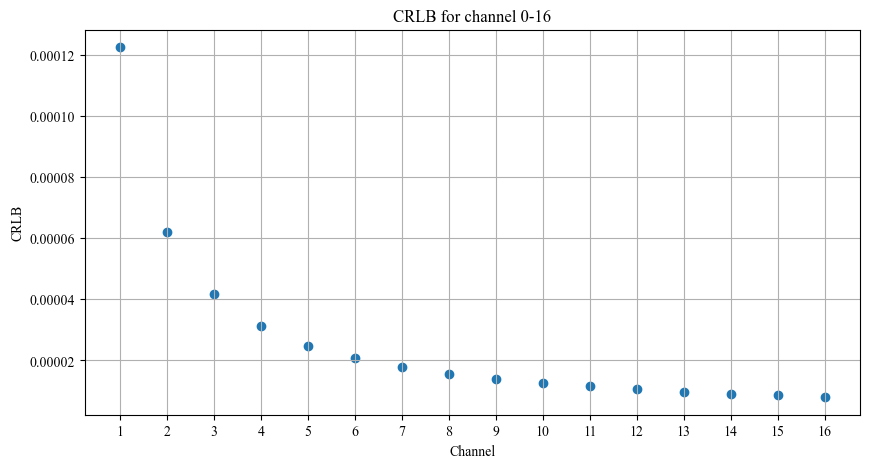

In [40]:


# #CRLB
CRLB=np.zeros(16)
fs=16000
for i in range(16):
    channel_speech=np.mean(Data[:,0:i+1],axis=1)  
    noise_segment = channel_speech[:fs]
    frequencies, power_spectral_density = welch(noise_segment, fs, nperseg=320) #Calculate power spectral density
    CRLB[i] = np.sum(power_spectral_density) / len(power_spectral_density)  #Calculate average power


# Plot CRLB for each channel as points
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), CRLB)
plt.title('CRLB for channel 0-16')
plt.xticks(range(1, 17))
plt.xlabel('Channel')
plt.ylabel('CRLB')
plt.grid()
plt.show()



## 2. Denoise

### 2.1. Denoise with MLE

#### 2.1.1 MLE for single channel

In [41]:
def MLE_speech_enhancement(speech_noisy_freq):
    """
    Perform maximum likelihood estimation (MLE) based speech enhancement.

    Parameters:
    speech_noisy_freq (ndarray): Noisy speech frequency domain representation with shape (D, T), where D is the number of frequency bins, T is the number of frames.

    Returns:
    speech_enhanced (ndarray): Enhanced speech in the time domain.
    speech_enhanced_freq (ndarray): Enhanced speech frequency domain representation with shape (D, T), where D is the number of frequency bins and T is the number of frames.

    """

    # parameters
    max_gamma = 40  # maximum value of gamma
    mu_VAD = 0.9  # parameter for VAD noise tracking  
    th_VAD =15  # VAD decision threshold 


    phase_noisy = np.angle(speech_noisy_freq)
    mag_noisy = np.abs(speech_noisy_freq)

    D, T = np.shape(mag_noisy)


    time_index_num = int(1//0.02)    # initial noise length: 1s
    noise_segment = mag_noisy[:, 0:time_index_num]
    mag_noise = np.mean(np.abs(noise_segment), axis=1)
    power_noise = mag_noise**2

    mag_enhance = np.zeros([D, T])

    for i in range(T):

        # get energy spectrum and magnitude spectrum for each frame
        mag_frame = mag_noisy[:, i]
        power_frame = mag_frame**2

        # get Signal-to-Noise Ratio (SNR) used for VAD calculation
        SNR_VAD = 10 * np.log10(np.sum(power_frame) / np.sum(power_noise))

        # calculate posterior SNR
        gamma = np.minimum(power_frame / power_noise, max_gamma)
    
        # update power_noise based on VAD
        mu = mu_VAD
        if SNR_VAD < th_VAD:
            power_noise = mu * power_noise + (1 - mu) * power_frame


        G = 0.5 + 0.5 * np.sqrt((abs(gamma - 1)) / gamma)

        
        mag_enhance_frame = G * mag_frame
        mag_enhance[:, i] = mag_enhance_frame

    speech_enhanced_freq = mag_enhance * np.exp(1j * phase_noisy)

    speech_enhanced = librosa.istft(speech_enhanced_freq, n_fft=frame_size, hop_length=hop_size, window='hann')

    return speech_enhanced, speech_enhanced_freq

SNR of the enhanced speech is:  3.324598098320504


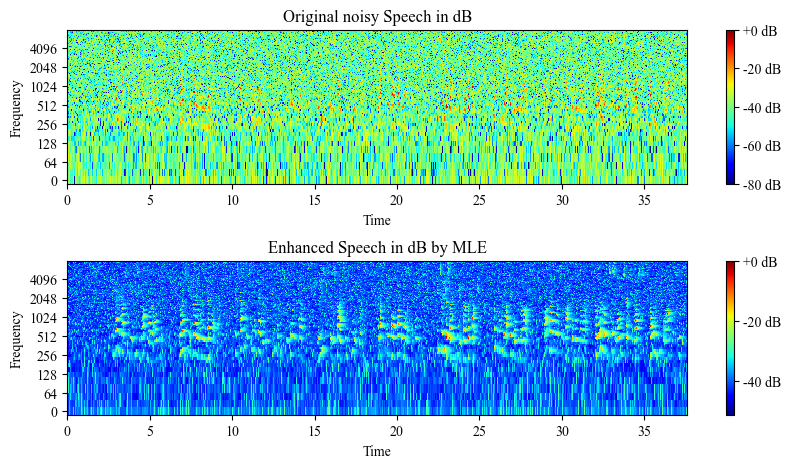

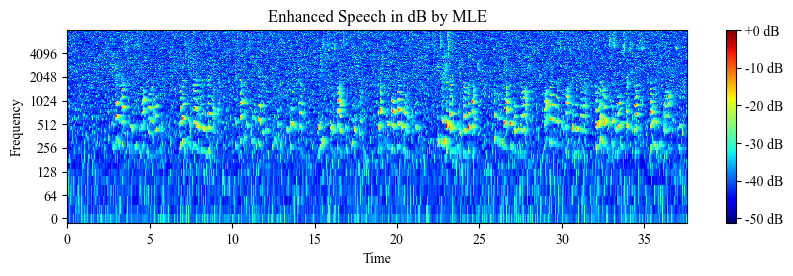

In [42]:
# Denoise the first noisy speech channel by the MLE speech enhancement
enhanced_speech, enhanced_speech_freq = MLE_speech_enhancement(speech_noisy_freq[:,:,0])  

#evaluation
print("SNR of the enhanced speech is: ", SNR(enhanced_speech))

#plot the enhanced speech
#subplots
plt.figure(figsize=(10,5))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,0]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MLE')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

sf.write("enhce_mmse.wav", enhanced_speech, fs)


#no comparison
plt.figure(figsize=(10,2.5))
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MLE')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

#### 2.1.2. MLE for multi channel

In [43]:
#Enancement for all channels only by calculating the mean of all channels
snr_all_mean=np.zeros(16)
speech_enhanced_all_mean=np.zeros((601600,16))
speech_enhanced_freq_all_mean=np.zeros((321,3761,16))

for i in range(16):
    speech_enhanced_freq_all_mean[:,:,i]=np.mean(speech_noisy_freq[:,:,0:i+1],axis=2)
    speech_enhanced_all_mean[:,i] = librosa.istft(speech_enhanced_freq_all_mean[:,:,i], n_fft=frame_size, hop_length=hop_size, window='hann') 
    
    snr_all_mean[i] = SNR(speech_enhanced_all_mean[:,i])


In [44]:

def MLE_multi_channel_speech_enhancement(speech_noisy_freq):
    """
    Applies Maximum Likelihood Estimation (MLE) based multi-channel speech enhancement to the given noisy speech frequency domain representation.

    Parameters:
    speech_noisy_freq (ndarray): Noisy speech frequency domain representation with shape (D, T, L), where D is the number of frequency bins, T is the number of frames, and L is the number of channels.

    Returns:
    speech_enhanced (ndarray): Enhanced speech in the time domain.
    speech_enhanced_freq (ndarray): Enhanced speech frequency domain representation with shape (D, T), where D is the number of frequency bins and T is the number of frames.
    """
    
    
    speech_noisy_freq = np.mean(speech_noisy_freq, axis=2)  # average over all channels

    # parameters
    max_gamma = 40  # maximum value of gamma
    mu_VAD = 0.9  # parameter for VAD noise tracking  
    th_VAD = 5  # VAD decision threshold 


    phase_noisy = np.angle(speech_noisy_freq)
    mag_noisy = np.abs(speech_noisy_freq)

    D, T = np.shape(mag_noisy)

    time_index_num = int(1//0.02)    # initial noise length: 1s
    noise_segment = mag_noisy[:, 0:time_index_num]
    mag_noise = np.mean(np.abs(noise_segment), axis=1)
    power_noise = mag_noise**2

    mag_enhance = np.zeros([D, T])

    for i in range(T):

        # get energy spectrum and magnitude spectrum for each frame
        mag_frame = mag_noisy[:, i]
        power_frame = mag_frame**2

        # get Signal-to-Noise Ratio (SNR) used for VAD calculation
        SNR_VAD = 10 * np.log10(np.sum(power_frame) / np.sum(power_noise))

        # calculate posterior SNR
        gamma = np.minimum(power_frame / power_noise, max_gamma)
    
        # update power_noise based on VAD
        mu = mu_VAD
        if SNR_VAD < th_VAD:
            power_noise = mu * power_noise + (1 - mu) * power_frame


        G = 0.5 + 0.5 * np.sqrt((abs(gamma - 1)) / gamma)
        mag_enhance_frame = G * mag_frame
        mag_enhance[:, i] = mag_enhance_frame

    speech_enhanced_freq = mag_enhance * np.exp(1j * phase_noisy)

    speech_enhanced = librosa.istft(speech_enhanced_freq, n_fft=frame_size, hop_length=hop_size, window='hann')

    return speech_enhanced, speech_enhanced_freq


SNR of the enhanced speech is:  12.611582768246203


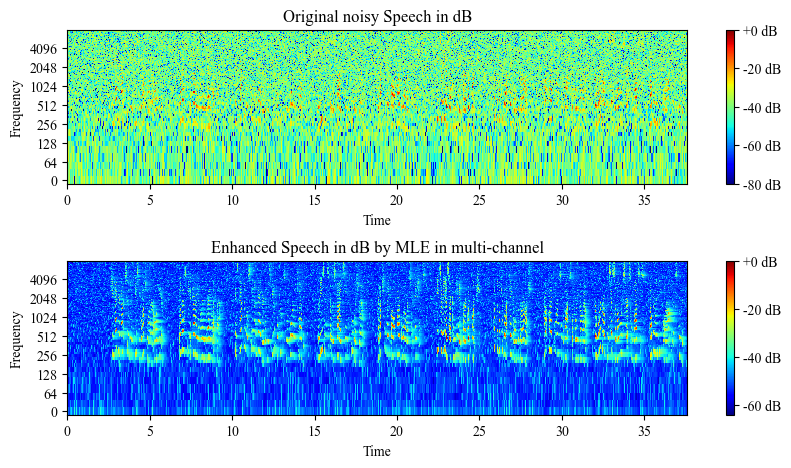

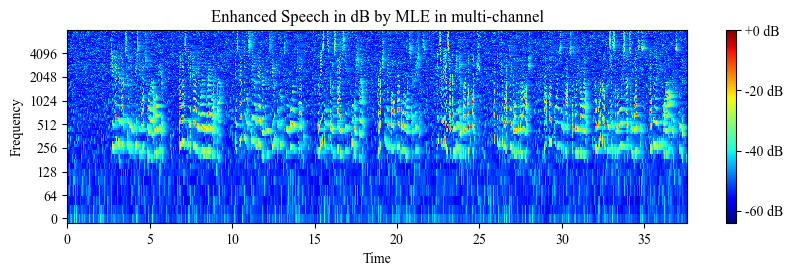

In [45]:
# Denoise the noisy speech by 16-channel MLE speech enhancement
enhanced_speech, enhanced_speech_freq = MLE_multi_channel_speech_enhancement(speech_noisy_freq)  

#evaluation
print("SNR of the enhanced speech is: ", SNR(enhanced_speech))

#plot the enhanced speech
#subplots
plt.figure(figsize=(10,5))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,0]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MLE in multi-channel')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

sf.write("enhce_mmse.wav", enhanced_speech, fs)

# no comparison with the original noisy speech
plt.figure(figsize=(10,2.5))
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MLE in multi-channel')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

In [46]:
# var_emp evaluation
def Var_emp(enhanced_speech_freq_all):
    """
    Calculate the empirical variance for each frame in the enhanced speech frequency.

    Parameters:
    enhanced_speech_freq_all (ndarray): Array of shape (D, T, L) representing the enhanced speech frequency.

    Returns:
    var_emp_all (ndarray): Array of shape (L,) containing the empirical variance for each frame.
    """
    var_emp_all=np.zeros(16)
    D,T,L = np.shape(enhanced_speech_freq_all)
    for i in range(L):

        for j in range(T):
            var=np.sum((np.abs(clean_freq[:,j]-enhanced_speech_freq_all[:,j,i]))**2)
        
        var_emp_all[i] = (1/(D*T))*np.sum(var)
    return var_emp_all

C:\Users\skyho\AppData\Local\Temp\ipykernel_45912\1810998616.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  enhanced_speech_all_mle[:,i], enhanced_speech_freq_all_mle[:,:,i] = MLE_multi_channel_speech_enhancement(speech_noisy_freq[:,:,0:i+1])


SNR of the enhanced speech for all 0-16 channels is:  [ 3.26225858  5.0942531   6.41673883  7.3910446   8.22003299  8.85999885
  9.46692049  9.95516256 10.40196336 10.73594341 11.13371689 11.46544181
 11.76963576 12.05421667 12.35075485 12.61158277]


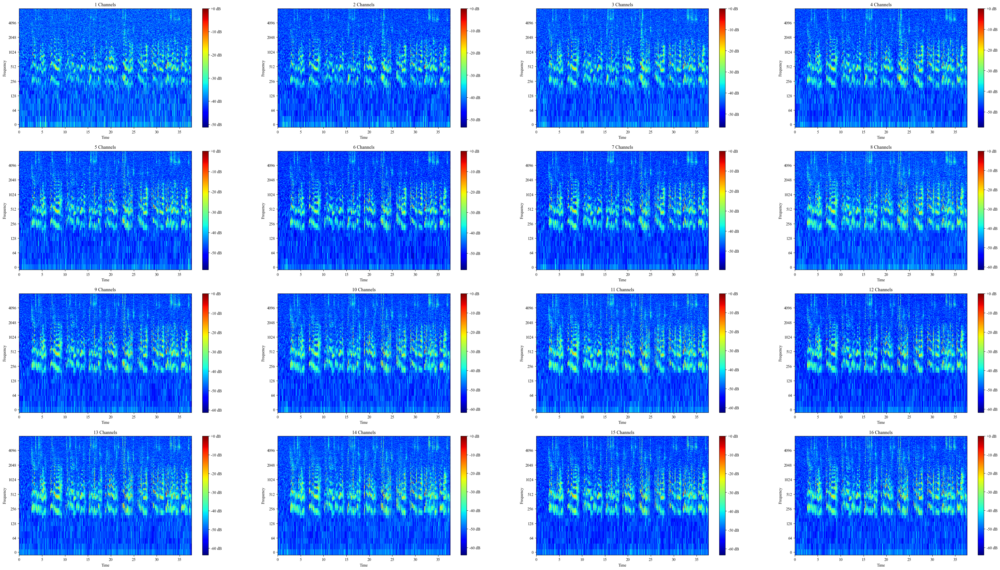

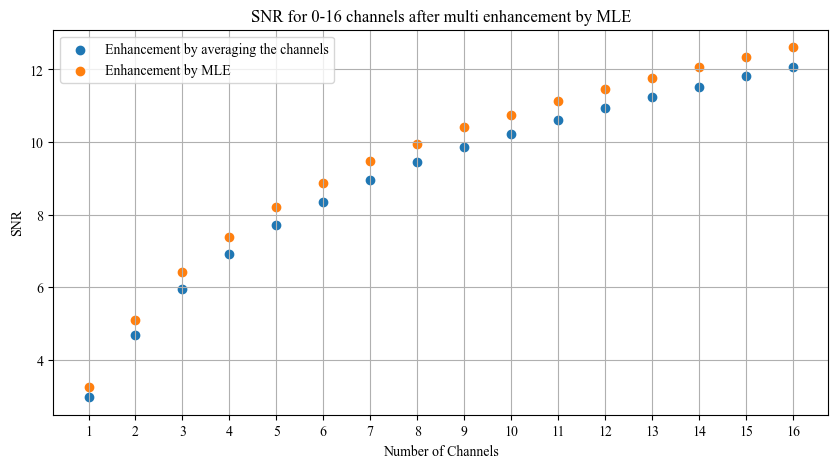

var_emp of the enhanced speech for all 0-16 channels is:  [0.0234241  0.01189255 0.00778948 0.005521   0.00476463 0.00401111
 0.00313507 0.00278461 0.00253029 0.00230326 0.00225902 0.00212269
 0.0019842  0.00182802 0.00173926 0.00162987]


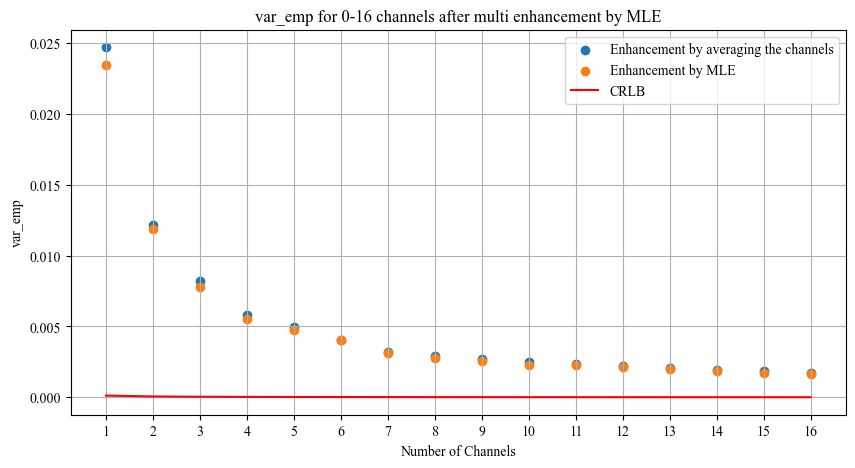

In [47]:
#Evaluion for 0-16 channels by SNR and var_emp
enhanced_speech_all_mle=np.zeros((len(enhanced_speech),16))
enhanced_speech_freq_all_mle=np.zeros((321,3761,16))
snr_all_mle=np.zeros(16)

for i in range(16):
    enhanced_speech_all_mle[:,i], enhanced_speech_freq_all_mle[:,:,i] = MLE_multi_channel_speech_enhancement(speech_noisy_freq[:,:,0:i+1])  
    snr_all_mle[i] = SNR(enhanced_speech_all_mle[:,i])

#evaluation
    
#plot the enhanced speech for all 16 channels
#subplots
plt.figure(figsize=(45,25))
for i in range(16):
    plt.subplot(4,4,i+1)
    librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq_all_mle[:,:,i]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
    plt.title(str(i+1)+' Channels')
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')


#plot snr for each channel
print("SNR of the enhanced speech for all 0-16 channels is: ", snr_all_mle)
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), snr_all_mean)
plt.scatter(range(1, 17), snr_all_mle)
plt.title('SNR for 0-16 channels after multi enhancement by MLE')
plt.xticks(range(1, 17))
plt.xlabel('Number of Channels')
plt.ylabel('SNR')
plt.grid()
#legand
plt.legend(['Enhancement by averaging the channels','Enhancement by MLE'])
plt.show()


# calculate the Var_emp
var_emp_all_mle=Var_emp(enhanced_speech_freq_all_mle)
var_emp_all_mean=Var_emp(speech_enhanced_freq_all_mean)
print("var_emp of the enhanced speech for all 0-16 channels is: ", var_emp_all_mle)
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), var_emp_all_mean)
plt.scatter(range(1, 17), var_emp_all_mle)
plt.plot(range(1, 17), CRLB, color='red')
plt.title('var_emp for 0-16 channels after multi enhancement by MLE')
plt.xticks(range(1, 17))
plt.xlabel('Number of Channels')
plt.ylabel('var_emp')
plt.legend(['Enhancement by averaging the channels','Enhancement by MLE','CRLB'])
plt.grid()
plt.show()

### 2.2 Denoise with MMSE


#### 2.2.1 MMSE for single channel


In [48]:
#single channel speech enhancement
def MMSE_speech_enhancement(speech_noisy_freq):
    """
    Enhances the given noisy speech signal using the MMSE (Minimum Mean Square Error) algorithm.

    Parameters:
    speech_noisy_freq (ndarray): Noisy speech frequency domain representation with shape (D, T), where D is the number of frequency bins, T is the number of frames.

    Returns:
    speech_enhanced (ndarray): Enhanced speech in the time domain.
    speech_enhanced_freq (ndarray): Enhanced speech frequency domain representation with shape (D, T), where D is the number of frequency bins and T is the number of frames.
    """
    
    
    
    # parameters
    max_gamma = 40  # maximum value of gamma
    alpha = 0.98  # parameter for updating ksi using decision-direct
    
    ksi_min = 10 ** (-15 / 10)  # minimum value of ksi: -15dB   
                                #recommended in literature as -15dB 

    mu_VAD = 0.9  # parameter for VAD noise tracking  
    th_VAD = 5  # VAD decision threshold  

    phase_noisy = np.angle(speech_noisy_freq)
    mag_noisy = np.abs(speech_noisy_freq)

    D, T = np.shape(mag_noisy)

    time_index_num = int(1//0.02)    # initial noise length: 1s
    noise_segment = mag_noisy[:, 0:time_index_num]
    mag_noise = np.mean(np.abs(noise_segment), axis=1)
    power_noise = mag_noise**2

    mag_enhance = np.zeros([D, T])
    alpha = alpha

    for i in range(T):

        # get energy spectrum and magnitude spectrum for each frame
        mag_frame = mag_noisy[:, i]
        power_frame = mag_frame**2

        # get Signal-to-Noise Ratio (SNR) used for VAD calculation
        SNR_VAD = 10 * np.log10(np.sum(power_frame) / np.sum(power_noise))

        # calculate posterior SNR
        gamma = np.minimum(power_frame / power_noise, max_gamma)

        # calculate prior SNR
        if i == 0:
            ksi = alpha + (1 - alpha) * np.maximum(gamma - 1, 0)
        else:
            ksi = alpha * power_enhance_frame / power_noise + (1 - alpha) * np.maximum(gamma - 1, 0)
            # limit the minimum value of ksi
            ksi = np.maximum(ksi_min, ksi)

        # update power_noise based on VAD
        mu = mu_VAD
        if SNR_VAD < th_VAD:
            power_noise = mu * power_noise + (1 - mu) * power_frame

        # H = para["fun_GAN"](ksi, gamma)
        c = np.sqrt(np.pi) / 2

        v = gamma * ksi / (1 + ksi)

        # standard mmse
        j_0 = sp.iv(0, v/2)
        j_1 = sp.iv(1, v/2)
        C = np.exp(-0.5 * v)          
        H = (((c * (v ** 0.5)) * C) / gamma)  * ((1 + v) * j_0 + v * j_1 )    

        mag_enhance_frame = H * mag_frame
        mag_enhance[:, i] = mag_enhance_frame

        power_enhance_frame = mag_enhance_frame ** 2

    speech_enhanced_freq = mag_enhance * np.exp(1j * phase_noisy)

    speech_enhanced = librosa.istft(speech_enhanced_freq, n_fft=frame_size, hop_length=hop_size, window='hann')

    return speech_enhanced, speech_enhanced_freq


SNR of the enhanced speech is:  9.575835154273872


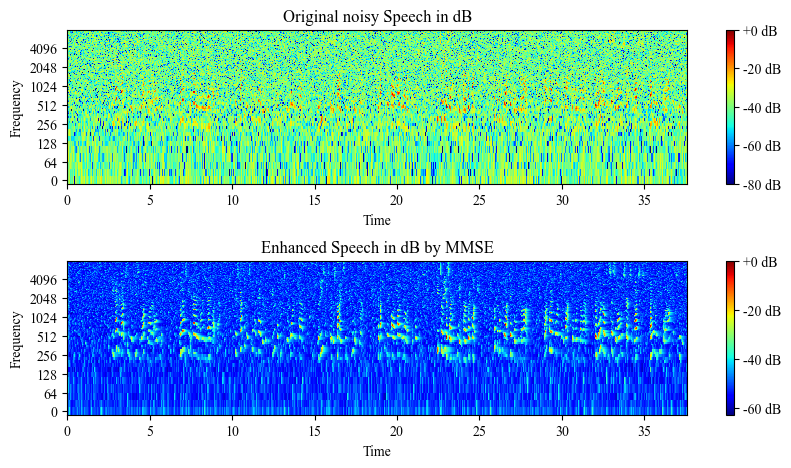

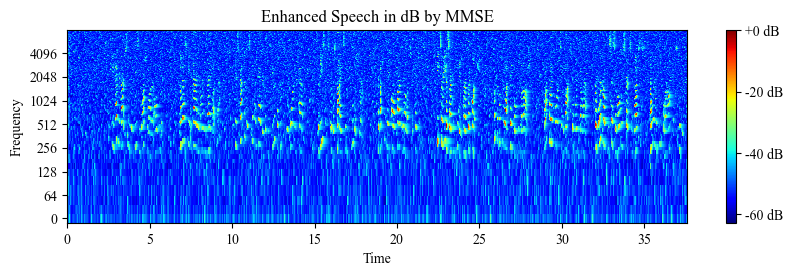

In [49]:

# Try to use the first channel to do the speech enhancement
enhanced_speech, enhanced_speech_freq = MMSE_speech_enhancement(speech_noisy_freq[:,:,0])  

#evaluation
print("SNR of the enhanced speech is: ", SNR(enhanced_speech))

#plot the enhanced speech
#subplots
plt.figure(figsize=(10,5))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,0]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MMSE')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

sf.write("enhce_mmse.wav", enhanced_speech, fs)

#no comparison
plt.figure(figsize=(10,2.5))
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MMSE')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()


#### 2.2.2 Multi channel MMSE

In [50]:
#multi channel speech enhancement

def MMSE_MultiChannel_speech_enhancement(speech_noisy_freq):
    """
    Enhances the given noisy speech signal using the MMSE (Minimum Mean Square Error) algorithm.

    Parameters:
    speech_noisy_freq (ndarray): Noisy speech frequency domain representation with shape (D, T), where D is the number of frequency bins, T is the number of frames.

    Returns:
    speech_enhanced (ndarray): Enhanced speech in the time domain.
    speech_enhanced_freq (ndarray): Enhanced speech frequency domain representation with shape (D, T), where D is the number of frequency bins and T is the number of frames.
    """
    
    speech_noisy_freq=np.mean(speech_noisy_freq,axis=2) #average over all channels

    # parameters
    max_gamma = 40  # maximum value of gamma
    alpha = 0.98  # parameter for updating ksi using decision-direct
    
    ksi_min = 10 ** (-15 / 10)  # minimum value of ksi: -15dB   
                                #recommended in literature as -15dB 

    mu_VAD = 0.9  # parameter for VAD noise tracking  
    th_VAD = 5  # VAD decision threshold  

    phase_noisy = np.angle(speech_noisy_freq)
    mag_noisy = np.abs(speech_noisy_freq)

    D, T = np.shape(mag_noisy)

    time_index_num = int(1//0.02)    # initial noise length: 1s
    noise_segment = mag_noisy[:, 0:time_index_num]
    mag_noise = np.mean(np.abs(noise_segment), axis=1)
    power_noise = mag_noise**2

    mag_enhance = np.zeros([D, T])
    alpha = alpha

    for i in range(T):

        # get energy spectrum and magnitude spectrum for each frame
        mag_frame = mag_noisy[:, i]
        power_frame = mag_frame**2

        # get Signal-to-Noise Ratio (SNR) used for VAD calculation
        SNR_VAD = 10 * np.log10(np.sum(power_frame) / np.sum(power_noise))

        # calculate posterior SNR
        gamma = np.minimum(power_frame / power_noise, max_gamma)

        # calculate prior SNR
        if i == 0:
            ksi = alpha + (1 - alpha) * np.maximum(gamma - 1, 0)
        else:
            ksi = alpha * power_enhance_frame / power_noise + (1 - alpha) * np.maximum(gamma - 1, 0)
            # limit the minimum value of ksi
            ksi = np.maximum(ksi_min, ksi)

        # update power_noise based on VAD
        mu = mu_VAD
        if SNR_VAD < th_VAD:
            power_noise = mu * power_noise + (1 - mu) * power_frame

        # H = para["fun_GAN"](ksi, gamma)
        c = np.sqrt(np.pi) / 2

        v = gamma * ksi / (1 + ksi)

        # standard mmse
        j_0 = sp.iv(0, v/2)
        j_1 = sp.iv(1, v/2)
        C = np.exp(-0.5 * v)          
        H = (((c * (v ** 0.5)) * C) / gamma)  * ((1 + v) * j_0 + v * j_1 )    

        mag_enhance_frame = H * mag_frame
        mag_enhance[:, i] = mag_enhance_frame

        power_enhance_frame = mag_enhance_frame ** 2

    speech_enhanced_freq = mag_enhance * np.exp(1j * phase_noisy)

    speech_enhanced = librosa.istft(speech_enhanced_freq, n_fft=frame_size, hop_length=hop_size, window='hann')

    return speech_enhanced, speech_enhanced_freq



SNR of the enhanced speech is:  23.008324000311823


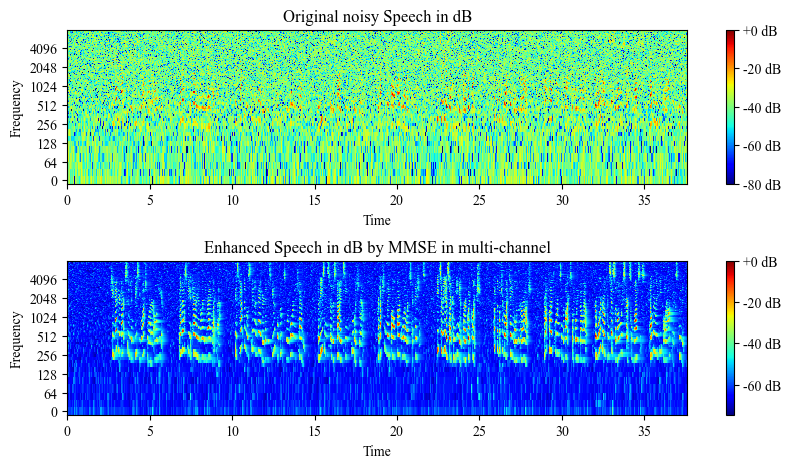

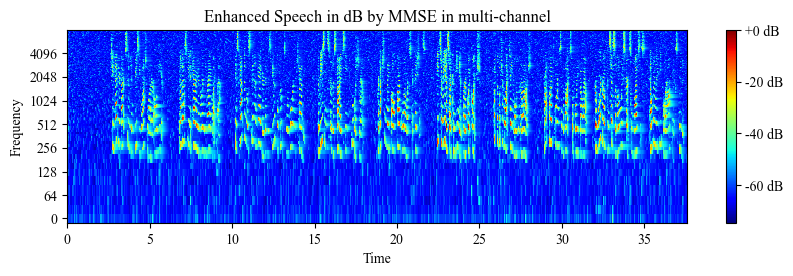

In [51]:
enhanced_speech, enhanced_speech_freq = MMSE_MultiChannel_speech_enhancement(speech_noisy_freq)  

print("SNR of the enhanced speech is: ", SNR(enhanced_speech))


#plot the enhanced speech
#subplots
plt.figure(figsize=(10,5))
plt.subplot(2,1,1)
librosa.display.specshow(librosa.amplitude_to_db(abs(speech_noisy_freq[:,:,0]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Original noisy Speech in dB')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MMSE in multi-channel')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()

sf.write("enhce_mmse.wav", enhanced_speech, fs)

#no comparison
plt.figure(figsize=(10,2.5))
librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
plt.title('Enhanced Speech in dB by MMSE in multi-channel')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar(format='%+2.0f dB')
plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()


C:\Users\skyho\AppData\Local\Temp\ipykernel_45912\3214529736.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  enhanced_speech_all_mmse[:,i], enhanced_speech_freq_all_mmse[:,:,i] = MMSE_MultiChannel_speech_enhancement(speech_noisy_freq[:,:,0:i+1])


SNR of the enhanced speech for all 0-16 channels is:  [ 9.57583515 13.1463339  15.15211702 16.48356517 17.68927372 18.54015456
 19.33668636 19.89769158 20.4148759  20.8226047  21.32258891 21.69291968
 22.08570917 22.38973919 22.73278631 23.008324  ]


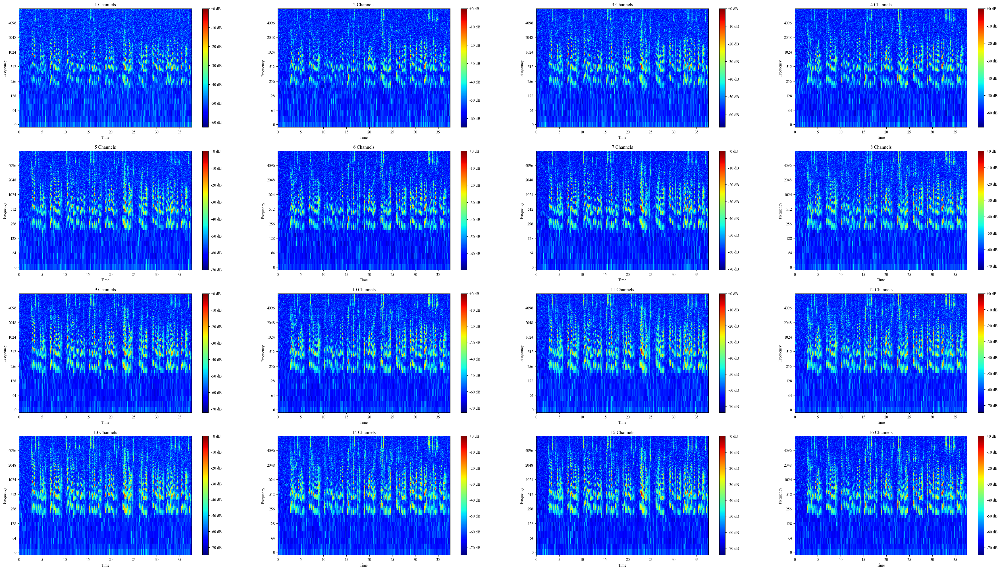

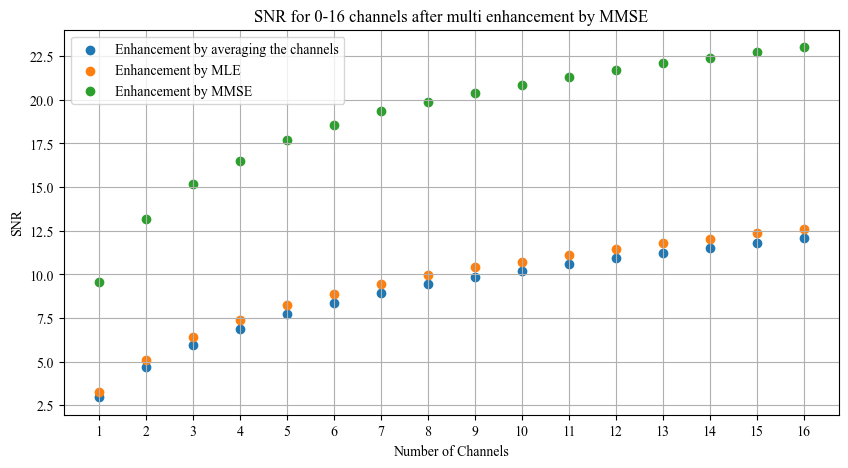

var_emp of the enhanced speech for all 0-16 channels is:  [0.00154228 0.00073974 0.00051968 0.00034581 0.00029157 0.00024453
 0.00021638 0.000186   0.00017704 0.00016496 0.00016363 0.00014483
 0.00013362 0.00012714 0.00012447 0.00011581]


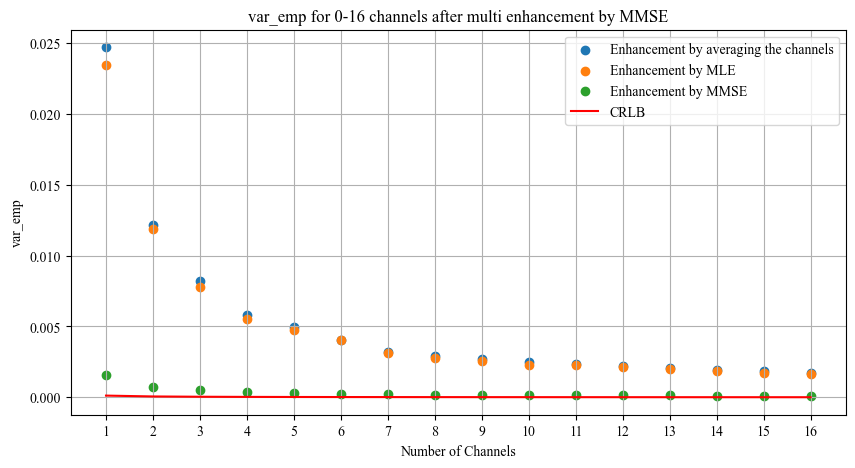

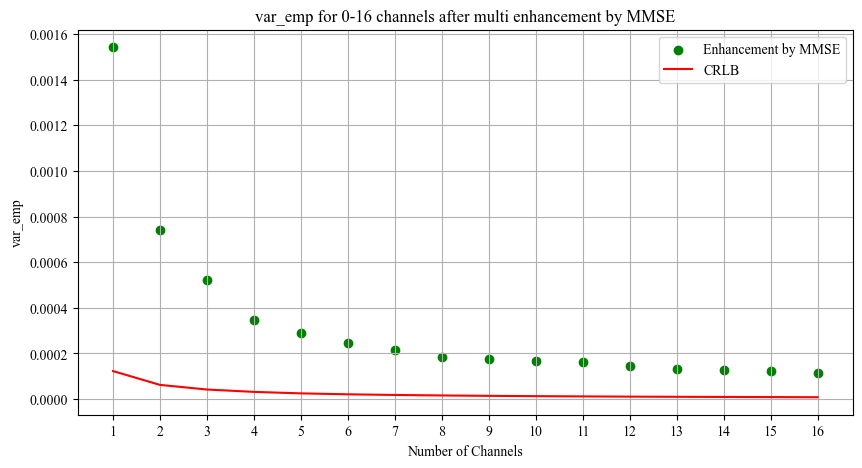

In [52]:
#Evaluion for 0-16 channels by SNR and var_emp
enhanced_speech_all_mmse=np.zeros((len(enhanced_speech),16))
enhanced_speech_freq_all_mmse=np.zeros((321,3761,16))
snr_all_mmse=np.zeros(16)

for i in range(16):
    enhanced_speech_all_mmse[:,i], enhanced_speech_freq_all_mmse[:,:,i] = MMSE_MultiChannel_speech_enhancement(speech_noisy_freq[:,:,0:i+1])  
    snr_all_mmse[i] = SNR(enhanced_speech_all_mmse[:,i])

#evaluation
    
#plot the enhanced speech for all 16 channels
#subplots
plt.figure(figsize=(45,25))
for i in range(16):
    plt.subplot(4,4,i+1)
    librosa.display.specshow(librosa.amplitude_to_db(abs(enhanced_speech_freq_all_mmse[:,:,i]), ref=np.max), sr=sample_rate, hop_length=hop_size, x_axis='time', y_axis='log',cmap='jet')
    plt.title(str(i+1)+' Channels')
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.colorbar(format='%+2.0f dB')


#plot snr for each channel
print("SNR of the enhanced speech for all 0-16 channels is: ", snr_all_mmse)
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), snr_all_mean)
plt.scatter(range(1, 17), snr_all_mle)
plt.scatter(range(1, 17), snr_all_mmse)

plt.title('SNR for 0-16 channels after multi enhancement by MMSE')
plt.xticks(range(1, 17))
plt.xlabel('Number of Channels')
plt.ylabel('SNR')
plt.grid()
#legand
plt.legend(['Enhancement by averaging the channels','Enhancement by MLE', 'Enhancement by MMSE'])
plt.show()


# calculate the Var_emp
var_emp_all_mmse=Var_emp(enhanced_speech_freq_all_mmse)
var_emp_all_mean=Var_emp(speech_enhanced_freq_all_mean)
print("var_emp of the enhanced speech for all 0-16 channels is: ", var_emp_all_mmse)
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), var_emp_all_mean)
plt.scatter(range(1, 17), var_emp_all_mle)
plt.scatter(range(1, 17), var_emp_all_mmse)
plt.plot(range(1, 17), CRLB, color='red')
plt.title('var_emp for 0-16 channels after multi enhancement by MMSE')
plt.xticks(range(1, 17))
plt.xlabel('Number of Channels')
plt.ylabel('var_emp')
plt.legend(['Enhancement by averaging the channels','Enhancement by MLE', 'Enhancement by MMSE','CRLB'])
plt.grid()
plt.show()

# calculate the Var_emp with only MMSE
plt.figure(figsize=(10,5))
plt.scatter(range(1, 17), var_emp_all_mmse, color='green')
plt.plot(range(1, 17), CRLB, color='red')
plt.title('var_emp for 0-16 channels after multi enhancement by MMSE')
plt.xticks(range(1, 17))
plt.xlabel('Number of Channels')
plt.ylabel('var_emp')
plt.legend(['Enhancement by MMSE','CRLB'])
plt.grid()
plt.show()